# Adversarial Patch Lab — License Plate Attack on YOLOv8

## 1. Setup e Import

In [1]:
import sys
from pathlib import Path

import cv2
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn.functional as F
from PIL import Image
from ultralytics import YOLO

# Paths
PROJECT_ROOT = Path(".").resolve().parents[1]
TEXTURE_PATH = PROJECT_ROOT / "assets" / "T_LicensePlate_d.TGA"
WEIGHTS_PATH = PROJECT_ROOT / "src" / "vehicle_counting_model" / "yolov8n.pt"
DATASET_PATH = PROJECT_ROOT / "data" / "CCPD2020" / "ccpd_green" / "train"

# Device
if torch.backends.mps.is_available():
    DEVICE = torch.device("mps")
elif torch.cuda.is_available():
    DEVICE = torch.device("cuda")
else:
    DEVICE = torch.device("cpu")

print(f"Project root: {PROJECT_ROOT}")
print(f"Device: {DEVICE}")

VEHICLE_CLASS_IDS = [2, 5, 7]  # car, bus, truck
VEHICLE_CLASSES = {2: "car", 5: "bus", 7: "truck"}
IMG_SIZE = 640


Project root: /Users/paolodeidda/Documents/UNI/Master/Tesi
Device: mps


## 2. Funzioni di utilità (dal baseline)

Riusiamo il parsing CCPD e aggiungiamo il letterbox preprocessing che YOLO richiede.

In [2]:
def parse_ccpd_corners(filename: str) -> np.ndarray:
    """Estrae i 4 angoli della targa dal nome file CCPD.
    Returns: array (4, 2) float32, ordine BR, BL, TL, TR."""
    stem = Path(filename).stem
    parts = stem.split("-")
    if len(parts) != 7:
        raise ValueError(f"Expected 7 fields, got {len(parts)}: {filename}")
    vertices = []
    for pt in parts[3].split("_"):
        x, y = pt.split("&")
        vertices.append([int(x), int(y)])
    return np.array(vertices, dtype=np.float32)


def load_texture(texture_path: str) -> np.ndarray:
    """Load CARLA texture as BGR, cropped to alpha bounding box."""
    tex = Image.open(texture_path).convert("RGBA")
    arr = np.array(tex)
    alpha = arr[:, :, 3]
    rows = np.where(alpha.max(axis=1) > 0)[0]
    cols = np.where(alpha.max(axis=0) > 0)[0]
    cropped = arr[rows[0]:rows[-1]+1, cols[0]:cols[-1]+1, :3]
    return cv2.cvtColor(cropped, cv2.COLOR_RGB2BGR)


def letterbox(image: np.ndarray, target_size: int = 640):
    """Resize con padding (letterbox) per mantenere aspect ratio."""
    h, w = image.shape[:2]
    scale = min(target_size / h, target_size / w)
    new_w, new_h = int(w * scale), int(h * scale)
    resized = cv2.resize(image, (new_w, new_h))
    padded = np.full((target_size, target_size, 3), 114, dtype=np.uint8)
    pad_w = (target_size - new_w) // 2
    pad_h = (target_size - new_h) // 2
    padded[pad_h:pad_h+new_h, pad_w:pad_w+new_w] = resized
    return padded, scale, pad_w, pad_h


def transform_corners(corners: np.ndarray, scale: float, pad_w: int, pad_h: int) -> np.ndarray:
    """Trasforma le coordinate dei corner nel sistema letterbox."""
    return corners * scale + np.array([pad_w, pad_h], dtype=np.float32)


def image_to_tensor(image_bgr: np.ndarray) -> torch.Tensor:
    """BGR numpy (H,W,3) uint8 -> tensor (1,3,H,W) float32 [0,1] RGB."""
    rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
    t = torch.from_numpy(rgb).float() / 255.0
    return t.permute(2, 0, 1).unsqueeze(0)


def tensor_to_numpy_bgr(t: torch.Tensor) -> np.ndarray:
    """Tensor (1,3,H,W) RGB float -> numpy (H,W,3) BGR uint8."""
    img = t[0].detach().cpu().permute(1, 2, 0).clamp(0, 1).numpy()
    img = (img * 255).astype(np.uint8)
    return cv2.cvtColor(img, cv2.COLOR_RGB2BGR)


def run_yolo_eval(model, image_bgr: np.ndarray) -> list[dict]:
    """Run YOLO con NMS, ritorna solo detection veicoli con bbox."""
    results = model(image_bgr, verbose=False)
    detections = []
    for r in results:
        for box in r.boxes:
            cls_id = int(box.cls[0])
            if cls_id in VEHICLE_CLASSES:
                detections.append({
                    "class_id": cls_id,
                    "class_name": VEHICLE_CLASSES[cls_id],
                    "confidence": float(box.conf[0]),
                    "bbox": box.xyxy[0].tolist(),
                })
    return detections


def draw_detections(image_rgb: np.ndarray, detections: list, color=(0, 255, 0)) -> np.ndarray:
    """Disegna bounding box e confidence su un'immagine RGB."""
    vis = image_rgb.copy()
    for d in detections:
        x1, y1, x2, y2 = [int(v) for v in d["bbox"]]
        cv2.rectangle(vis, (x1, y1), (x2, y2), color, 2)
        label = f'{d["class_name"]} {d["confidence"]:.3f}'
        cv2.putText(vis, label, (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1)
    return vis


print("Utility functions loaded.")


Utility functions loaded.


## 3. Perspective Warp Differenziabile

Questo è il passaggio chiave. `cv2.warpPerspective` non supporta il gradiente, quindi dobbiamo reimplementarlo in PyTorch puro.

**Come funziona:**
1. Calcoliamo la matrice omografica H che mappa patch → immagine (con OpenCV, è costante)
2. Invertiamo H per ottenere il mapping immagine → patch
3. Per ogni pixel dell'immagine nel rettangolo della targa, troviamo da dove pescare nella patch
4. Usiamo `grid_sample` (differenziabile!) per campionare i pixel dalla patch

Il gradiente fluisce attraverso `grid_sample` fino alla patch, perché i valori dei pixel della patch sono l'input, mentre la griglia di coordinate è costante.

In [3]:
def compute_homography(patch_h: int, patch_w: int, dst_corners: np.ndarray) -> np.ndarray:
    """Calcola la matrice omografica per mappare la patch sui corner della targa.
    
    Args:
        patch_h, patch_w: dimensioni della patch
        dst_corners: (4, 2) in ordine CCPD: BR, BL, TL, TR
    
    Returns:
        H_inv: matrice 3x3 che mappa coordinate immagine → coordinate patch
    """
    # Source corners della patch: TL, TR, BR, BL
    src = np.array([
        [0, 0],                    # TL
        [patch_w - 1, 0],          # TR
        [patch_w - 1, patch_h - 1],# BR
        [0, patch_h - 1],          # BL
    ], dtype=np.float32)
    
    # Riordiniamo CCPD (BR,BL,TL,TR) → (TL,TR,BR,BL)
    dst = np.array([
        dst_corners[2],  # TL
        dst_corners[3],  # TR
        dst_corners[0],  # BR
        dst_corners[1],  # BL
    ], dtype=np.float32)
    
    H = cv2.getPerspectiveTransform(src, dst)      # patch → image
    H_inv = cv2.getPerspectiveTransform(dst, src)   # image → patch
    return H_inv


def differentiable_patch_apply(
    image_tensor: torch.Tensor,    # (1, 3, H, W) — su qualsiasi device
    patch_tensor: torch.Tensor,    # (1, 3, Ph, Pw) — su qualsiasi device
    dst_corners: np.ndarray,       # (4, 2) in CCPD order
    img_size: int = 640,
) -> torch.Tensor:
    """Applica la patch sull'immagine in modo differenziabile.
    
    NOTA: grid_sample backward non è supportato su MPS (Apple Silicon).
    Quindi facciamo warp e compositing su CPU, poi spostiamo su device per YOLO.
    Il gradiente fluisce comunque correttamente attraverso grid_sample su CPU.
    """
    device = image_tensor.device
    _, _, ph, pw = patch_tensor.shape
    
    # === Tutto su CPU per grid_sample ===
    image_cpu = image_tensor.cpu()
    patch_cpu = patch_tensor.cpu()
    
    # 1. Omografia inversa: image → patch
    H_inv = compute_homography(ph, pw, dst_corners)
    H_inv_t = torch.from_numpy(H_inv).float()
    
    # 2. Griglia di coordinate dell'immagine
    ys = torch.arange(img_size, dtype=torch.float32)
    xs = torch.arange(img_size, dtype=torch.float32)
    grid_y, grid_x = torch.meshgrid(ys, xs, indexing="ij")
    
    # Coordinate omogenee: (3, H*W)
    ones = torch.ones_like(grid_x)
    coords = torch.stack([grid_x, grid_y, ones], dim=0).reshape(3, -1)
    
    # 3. Applichiamo H_inv per ottenere coordinate nella patch
    patch_coords = H_inv_t @ coords  # (3, H*W)
    patch_coords = patch_coords[:2] / (patch_coords[2:] + 1e-8)
    
    # 4. Normalizziamo a [-1, 1] per grid_sample
    patch_coords[0] = 2.0 * patch_coords[0] / (pw - 1) - 1.0
    patch_coords[1] = 2.0 * patch_coords[1] / (ph - 1) - 1.0
    
    grid = patch_coords.permute(1, 0).reshape(1, img_size, img_size, 2)
    
    # 5. grid_sample su CPU (backward supportato qui)
    warped_patch = F.grid_sample(
        patch_cpu, grid,
        mode="bilinear",
        padding_mode="zeros",
        align_corners=True,
    )
    
    # 6. Maschera poligonale
    mask_np = np.zeros((img_size, img_size), dtype=np.uint8)
    dst_reordered = np.array(
        [dst_corners[2], dst_corners[3], dst_corners[0], dst_corners[1]],
        dtype=np.int32,
    )
    cv2.fillConvexPoly(mask_np, dst_reordered.reshape(-1, 1, 2), 1)
    mask = torch.from_numpy(mask_np).float().unsqueeze(0).unsqueeze(0)
    
    # 7. Compositing su CPU (differenziabile)
    result_cpu = image_cpu * (1 - mask) + warped_patch * mask
    
    # Spostiamo il risultato sul device originale per YOLO forward
    return result_cpu.to(device)

## 4. Caricare YOLO per forward pass differenziabile

L'API high-level di ultralytics (`model(img)`) fa NMS internamente, che **spezza il gradiente**. Per il training adversariale, accediamo al modello PyTorch raw:

```python
raw_output shape: (1, 84, 8400)
                   ↑  ↑    ↑
                batch  │    n. anchors (20x20 + 40x40 + 80x80)
                       │
                 4 (box) + 80 (classi COCO, già sigmoid)
```

Le classi veicolo sono agli indici 4+2=6 (car), 4+5=9 (bus), 4+7=11 (truck).

In [4]:
# Carichiamo il modello
yolo = YOLO(str(WEIGHTS_PATH))
yolo_model = yolo.model.to(DEVICE).eval()

# Freeziamo tutti i pesi di YOLO — ottimizziamo SOLO la patch
for param in yolo_model.parameters():
    param.requires_grad = False

def yolo_forward(image_tensor: torch.Tensor) -> torch.Tensor:
    """Forward pass raw di YOLO, restituisce prediction pre-NMS.
    
    Args:
        image_tensor: (1, 3, 640, 640) float32 [0, 1] RGB, su DEVICE
    
    Returns:
        preds: (1, 84, 8400) — [4 box + 80 class scores] × 8400 anchors
    """
    out = yolo_model(image_tensor)
    # out è una tupla: (tensor (1,84,8400), dict con raw predictions)
    return out[0] if isinstance(out, tuple) else out


# Test: forward pass su immagine random
with torch.no_grad():
    dummy = torch.randn(1, 3, 640, 640, device=DEVICE)
    test_out = yolo_forward(dummy)
    print(f"YOLO output shape: {test_out.shape}")  # (1, 84, 8400)
    
    # Verifichiamo che i class scores sono in [0, 1] (post-sigmoid)
    cls_scores = test_out[0, 4:, :]  # (80, 8400)
    print(f"Class scores range: [{cls_scores.min():.4f}, {cls_scores.max():.4f}]")
    print(f"Vehicle class indices in output: car={4+2}=6, bus={4+5}=9, truck={4+7}=11")

YOLO output shape: torch.Size([1, 84, 8400])
Class scores range: [0.0000, 0.0843]
Vehicle class indices in output: car=6=6, bus=9=9, truck=11=11


## 5. Loss Function

L'obiettivo è **minimizzare la confidence** di YOLO per i veicoli. Dato che lavoriamo sulle prediction pre-NMS (8400 anchors), ci concentriamo sugli anchors con score più alto — sono quelli che YOLO selezionerebbe dopo NMS.

**Loss = media dei top-K vehicle scores** (minimizzandola, rendiamo YOLO meno sicuro)

Opzionalmente aggiungiamo **Total Variation (TV) loss** per mantenere la patch visivamente smooth e potenzialmente stampabile.

In [5]:
def adversarial_loss(
    preds: torch.Tensor,
    vehicle_ids: list[int] = VEHICLE_CLASS_IDS,
    top_k: int = 50,
) -> torch.Tensor:
    """Calcola la loss adversariale: media dei top-K vehicle confidence scores.
    
    Minimizzare questa loss = YOLO diventa meno sicuro che ci sia un veicolo.
    
    Args:
        preds: (1, 84, 8400) — output raw di YOLO
        vehicle_ids: indici COCO delle classi veicolo
        top_k: quanti anchors con score più alto considerare
    """
    cls_offset = 4
    vehicle_indices = [cls_offset + c for c in vehicle_ids]
    
    vehicle_scores = preds[0, vehicle_indices, :]  # (3, 8400)
    max_scores, _ = vehicle_scores.max(dim=0)  # (8400,)
    
    k = min(top_k, max_scores.shape[0])
    topk_scores, _ = max_scores.topk(k)
    
    return topk_scores.mean()


def total_variation_loss(patch: torch.Tensor) -> torch.Tensor:
    """Total Variation: penalizza variazioni brusche tra pixel adiacenti."""
    diff_h = (patch[:, :, 1:, :] - patch[:, :, :-1, :]).abs().mean()
    diff_w = (patch[:, :, :, 1:] - patch[:, :, :, :-1]).abs().mean()
    return diff_h + diff_w


print("Loss functions defined.")

Loss functions defined.


## 6. Preparare il dataset

Carichiamo un piccolo subset di immagini CCPD per il training. Pre-filtriamo solo quelle dove YOLO detecta almeno un veicolo (altrimenti non c'è nulla da attaccare).

Scanning images for vehicle detections (target: 100)...
Dataset ready: 100 images with vehicle detections


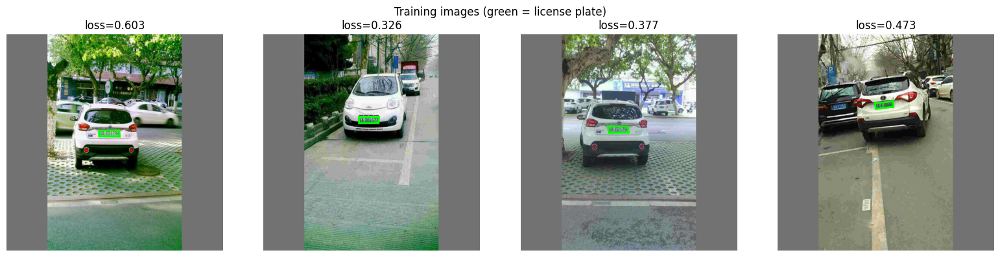

In [6]:
def load_dataset(dataset_path: Path, max_images: int = 30):
    """Carica immagini CCPD pre-filtrate (solo quelle con detection veicolo)."""
    image_files = sorted([f for f in dataset_path.iterdir() if f.suffix == ".jpg"])
    dataset = []
    print(f"Scanning images for vehicle detections (target: {max_images})...")
    for img_path in image_files:
        if len(dataset) >= max_images:
            break
        try:
            corners = parse_ccpd_corners(img_path.name)
        except ValueError:
            continue
        bgr = cv2.imread(str(img_path))
        if bgr is None:
            continue
        padded, scale, pad_w, pad_h = letterbox(bgr, IMG_SIZE)
        corners_lb = transform_corners(corners, scale, pad_w, pad_h)
        img_tensor = image_to_tensor(padded).to(DEVICE)
        with torch.no_grad():
            preds = yolo_forward(img_tensor)
            loss_val = adversarial_loss(preds).item()
        if loss_val > 0.3:
            dataset.append({
                "image_tensor": img_tensor,
                "corners": corners_lb,
                "original_bgr": padded,
                "filename": img_path.name,
                "initial_loss": loss_val,
            })
    print(f"Dataset ready: {len(dataset)} images with vehicle detections")
    return dataset


dataset = load_dataset(DATASET_PATH, max_images=100)

fig, axes = plt.subplots(1, 4, figsize=(16, 4))
for i, ax in enumerate(axes):
    if i < len(dataset):
        rgb = cv2.cvtColor(dataset[i]["original_bgr"], cv2.COLOR_BGR2RGB)
        ax.imshow(rgb)
        c = dataset[i]["corners"]
        poly = plt.Polygon(c[[2,3,0,1]], fill=False, edgecolor="lime", linewidth=2)
        ax.add_patch(poly)
        ax.set_title(f"loss={dataset[i]['initial_loss']:.3f}")
    ax.axis("off")
plt.suptitle("Training images (green = license plate)")
plt.tight_layout()
plt.show()


## 7. Inizializzazione della Patch

La patch è un tensore learnable con le dimensioni tipiche di una targa.

Due opzioni di inizializzazione:
- **Random**: rumore casuale in [0, 1]
- **From texture**: partiamo dalla texture CARLA

Proviamo con random — così è chiaro che qualsiasi pattern che emerge è stato imparato dall'ottimizzazione.

Patch shape: torch.Size([1, 3, 128, 256])
Patch device: cpu (CPU — necessario per grid_sample backward)
Patch parameters: 98,304 pixel values
Optimizer: Adam, lr=0.02
TV weight: 0.1


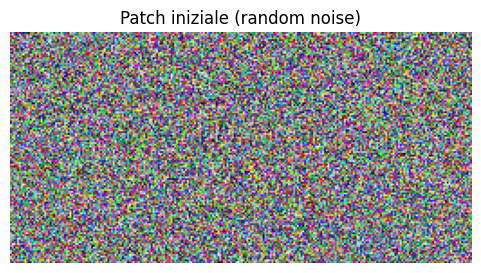

In [7]:
# Dimensioni della patch: aspect ratio tipico targa ~ 2:1
PATCH_H = 128
PATCH_W = 256

# La patch vive su CPU (grid_sample backward non supportato su MPS)
# YOLO resta su MPS/CUDA — il .to(device) in differentiable_patch_apply gestisce il passaggio
patch = torch.rand(1, 3, PATCH_H, PATCH_W, device="cpu", requires_grad=True)

# Optimizer: Adam con lr relativamente alto (la patch ha pochi parametri)
optimizer = torch.optim.Adam([patch], lr=0.02)

# Peso della TV loss (regolarizzazione)
TV_WEIGHT = 0.1

print(f"Patch shape: {patch.shape}")
print(f"Patch device: {patch.device} (CPU — necessario per grid_sample backward)")
print(f"Patch parameters: {PATCH_H * PATCH_W * 3:,} pixel values")
print(f"Optimizer: Adam, lr=0.02")
print(f"TV weight: {TV_WEIGHT}")

# Visualizziamo la patch iniziale
plt.figure(figsize=(6, 3))
plt.imshow(patch[0].detach().permute(1, 2, 0).clamp(0, 1).numpy())
plt.title("Patch iniziale (random noise)")
plt.axis("off")
plt.show()

## 8. Test: warp differenziabile

Prima di lanciare il training, verifichiamo che il warp funzioni e che il gradiente fluisca.

Loss value: 0.6022
Patch gradient exists: True
Patch gradient norm: 0.010765


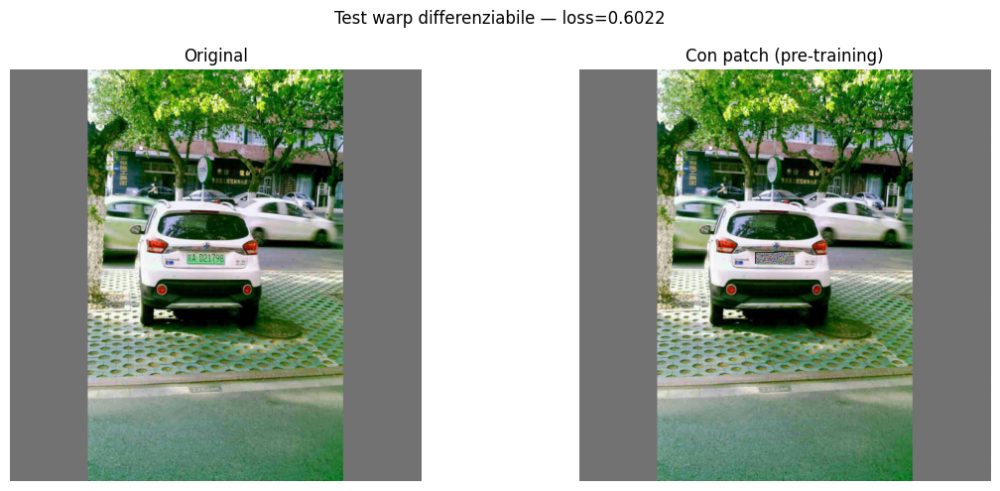

In [8]:
# Prendiamo la prima immagine del dataset
sample = dataset[0]

# Applichiamo la patch
patched = differentiable_patch_apply(
    sample["image_tensor"],
    patch,
    sample["corners"],
    IMG_SIZE,
)

# Verifichiamo che il gradiente fluisca
preds = yolo_forward(patched)
loss = adversarial_loss(preds)
loss.backward()

print(f"Loss value: {loss.item():.4f}")
print(f"Patch gradient exists: {patch.grad is not None}")
print(f"Patch gradient norm: {patch.grad.norm().item():.6f}")

# Reset gradient per il training
optimizer.zero_grad()

# Visualizziamo il risultato
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
orig_rgb = sample["image_tensor"][0].detach().cpu().permute(1, 2, 0).numpy()
patched_rgb = patched[0].detach().cpu().permute(1, 2, 0).clamp(0, 1).numpy()
axes[0].imshow(orig_rgb)
axes[0].set_title("Original")
axes[1].imshow(patched_rgb)
axes[1].set_title("Con patch (pre-training)")
for ax in axes:
    ax.axis("off")
plt.suptitle(f"Test warp differenziabile — loss={loss.item():.4f}")
plt.tight_layout()
plt.show()

## 9. Training Loop

Ora il cuore: ottimizziamo la patch per N epoche. Ogni epoca cicla su tutte le immagini del dataset.

Ad ogni step:
1. Applichiamo la patch sull'immagine
2. Forward pass YOLO
3. Calcoliamo la loss (adversarial + TV)
4. Backprop e update della patch
5. Clampiamo la patch in [0, 1]

Ogni 10 epoche salviamo uno snapshot della patch per vedere l'evoluzione.

In [9]:
N_EPOCHS = 100
SNAPSHOT_EVERY = 10

# Logging
history = {"epoch": [], "adv_loss": [], "tv_loss": [], "total_loss": []}
patch_snapshots = []  # salviamo la patch ogni SNAPSHOT_EVERY epoche

print(f"Training for {N_EPOCHS} epochs on {len(dataset)} images...")
print(f"{'Epoch':>6} | {'Adv Loss':>10} | {'TV Loss':>10} | {'Total':>10}")
print("-" * 50)

for epoch in range(N_EPOCHS):
    epoch_adv_loss = 0.0
    epoch_tv_loss = 0.0
    
    for sample in dataset:
        optimizer.zero_grad()
        
        # Forward: applica patch → YOLO
        patched_img = differentiable_patch_apply(
            sample["image_tensor"], patch, sample["corners"], IMG_SIZE
        )
        preds = yolo_forward(patched_img)
        
        # Loss
        adv_loss = adversarial_loss(preds)
        tv_loss = total_variation_loss(patch)
        total_loss = adv_loss + TV_WEIGHT * tv_loss
        
        # Backward
        total_loss.backward()
        optimizer.step()
        
        # Clamp patch a [0, 1]
        with torch.no_grad():
            patch.data.clamp_(0, 1)
        
        epoch_adv_loss += adv_loss.item()
        epoch_tv_loss += tv_loss.item()
    
    # Media sull'epoca
    n = len(dataset)
    avg_adv = epoch_adv_loss / n
    avg_tv = epoch_tv_loss / n
    avg_total = avg_adv + TV_WEIGHT * avg_tv
    
    history["epoch"].append(epoch)
    history["adv_loss"].append(avg_adv)
    history["tv_loss"].append(avg_tv)
    history["total_loss"].append(avg_total)
    
    if epoch % SNAPSHOT_EVERY == 0 or epoch == N_EPOCHS - 1:
        patch_snapshots.append((
            epoch,
            patch[0].detach().cpu().permute(1, 2, 0).clamp(0, 1).numpy().copy()
        ))
        print(f"{epoch:>6} | {avg_adv:>10.4f} | {avg_tv:>10.4f} | {avg_total:>10.4f}")

print("\nTraining complete!")

Training for 100 epochs on 100 images...
 Epoch |   Adv Loss |    TV Loss |      Total
--------------------------------------------------
     0 |     0.4011 |     0.3684 |     0.4379
    10 |     0.3606 |     0.3770 |     0.3983
    20 |     0.3481 |     0.3985 |     0.3880
    30 |     0.3387 |     0.4153 |     0.3802
    40 |     0.3295 |     0.4105 |     0.3705
    50 |     0.3259 |     0.4218 |     0.3681
    60 |     0.3193 |     0.3965 |     0.3590
    70 |     0.3152 |     0.4076 |     0.3560
    80 |     0.3109 |     0.3903 |     0.3500
    90 |     0.3223 |     0.4568 |     0.3680
    99 |     0.3146 |     0.4169 |     0.3563

Training complete!


## 10. Visualizzazione Risultati

### 10a. Curva di loss

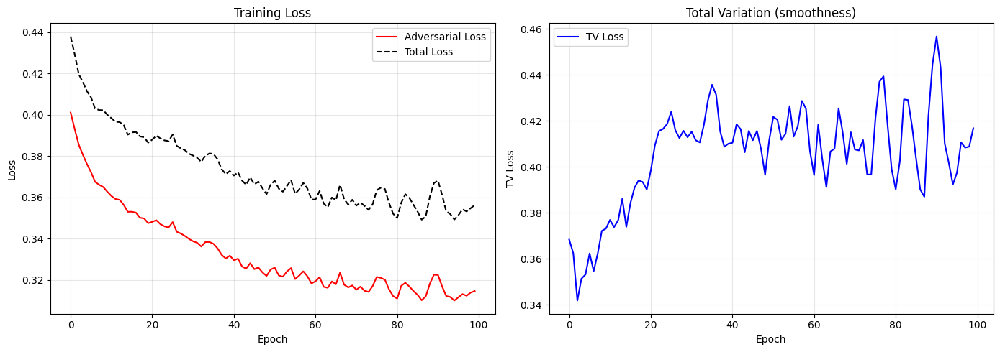

Adversarial loss: 0.4011 → 0.3146
Reduction: 21.6%


In [10]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

ax1.plot(history["epoch"], history["adv_loss"], label="Adversarial Loss", color="red")
ax1.plot(history["epoch"], history["total_loss"], label="Total Loss", color="black", linestyle="--")
ax1.set_xlabel("Epoch")
ax1.set_ylabel("Loss")
ax1.set_title("Training Loss")
ax1.legend()
ax1.grid(True, alpha=0.3)

ax2.plot(history["epoch"], history["tv_loss"], label="TV Loss", color="blue")
ax2.set_xlabel("Epoch")
ax2.set_ylabel("TV Loss")
ax2.set_title("Total Variation (smoothness)")
ax2.legend()
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print(f"Adversarial loss: {history['adv_loss'][0]:.4f} → {history['adv_loss'][-1]:.4f}")
print(f"Reduction: {(1 - history['adv_loss'][-1] / history['adv_loss'][0]) * 100:.1f}%")

### 10b. Evoluzione della patch

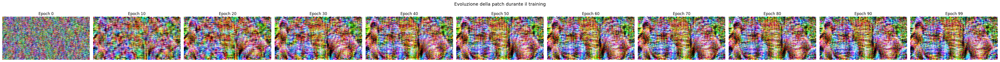

In [11]:
n_snaps = len(patch_snapshots)
fig, axes = plt.subplots(1, n_snaps, figsize=(4 * n_snaps, 3))
if n_snaps == 1:
    axes = [axes]

for ax, (ep, snap) in zip(axes, patch_snapshots):
    ax.imshow(snap)
    ax.set_title(f"Epoch {ep}")
    ax.axis("off")

plt.suptitle("Evoluzione della patch durante il training", fontsize=14)
plt.tight_layout()
plt.show()

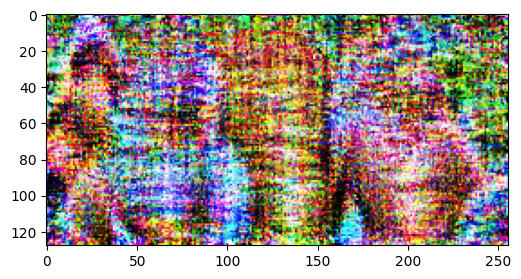

In [ ]:
final_patch = patch[0].detach().cpu().permute(1, 2, 0).clamp(0, 1).numpy()
plt.figure(figsize=(6, 3))
plt.imshow(final_patch)

### 10c. Confronto a 3 righe: Originale vs Patch vs Patch Camuffata

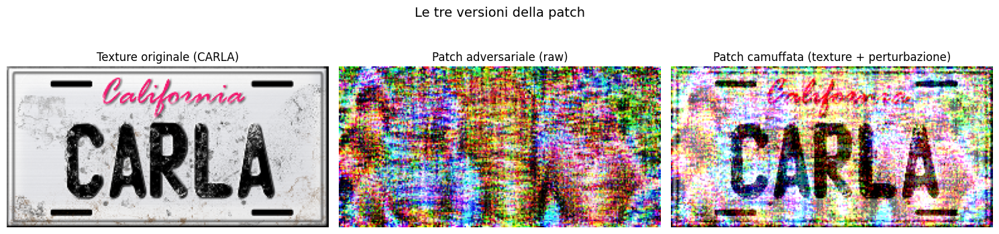

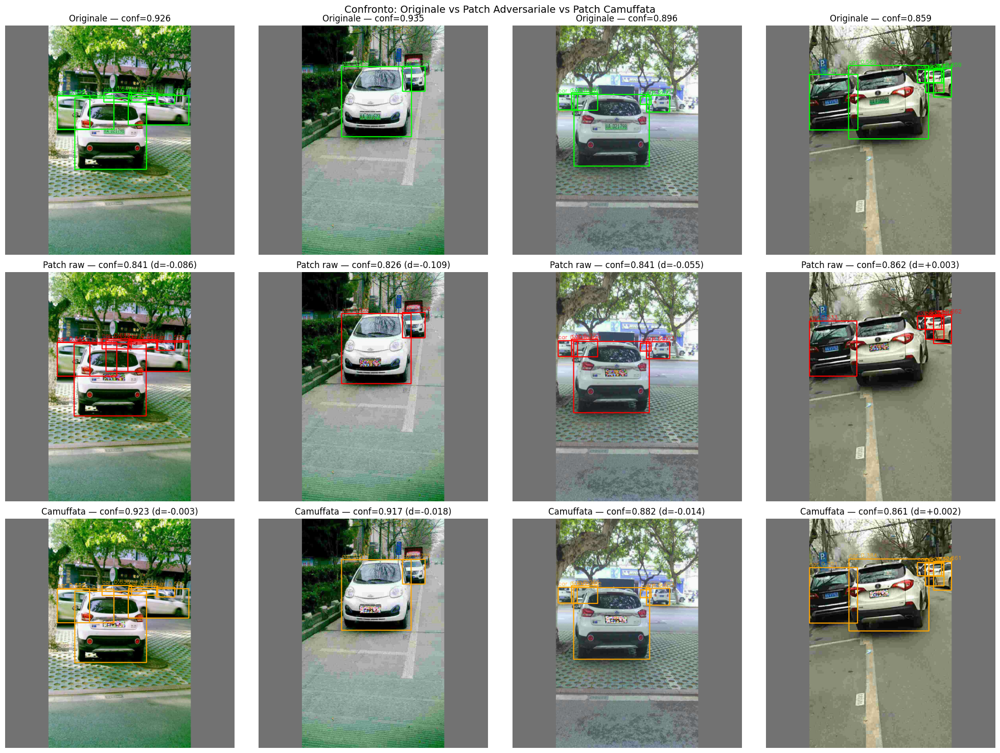

In [12]:
# Carichiamo la texture originale della targa CARLA per la versione camuffata
original_texture = load_texture(str(TEXTURE_PATH))
tex_rgb = cv2.cvtColor(original_texture, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0
tex_resized = cv2.resize(tex_rgb, (PATCH_W, PATCH_H))
texture_tensor = torch.from_numpy(tex_resized).permute(2, 0, 1).unsqueeze(0)

# Patch camuffata: texture originale + perturbazione adversariale
perturbation = patch.detach().cpu() - 0.5
camouflaged_patch = (texture_tensor + perturbation).clamp(0, 1)

# Preview delle 3 patch
fig, axes = plt.subplots(1, 3, figsize=(15, 4))
axes[0].imshow(tex_resized)
axes[0].set_title("Texture originale (CARLA)")
axes[1].imshow(patch[0].detach().cpu().permute(1, 2, 0).clamp(0, 1).numpy())
axes[1].set_title("Patch adversariale (raw)")
axes[2].imshow(camouflaged_patch[0].permute(1, 2, 0).numpy())
axes[2].set_title("Patch camuffata (texture + perturbazione)")
for ax in axes:
    ax.axis("off")
plt.suptitle("Le tre versioni della patch", fontsize=14)
plt.tight_layout()
plt.show()

# Confronto su immagini con YOLO detection
n_show = min(4, len(dataset))
fig, axes = plt.subplots(3, n_show, figsize=(5 * n_show, 15))

for i in range(n_show):
    sample = dataset[i]
    
    # Riga 1: Originale
    orig_bgr = tensor_to_numpy_bgr(sample["image_tensor"])
    orig_dets = run_yolo_eval(yolo, orig_bgr)
    orig_rgb = cv2.cvtColor(orig_bgr, cv2.COLOR_BGR2RGB)
    orig_vis = draw_detections(orig_rgb, orig_dets, color=(0, 255, 0))
    orig_conf = max([d["confidence"] for d in orig_dets], default=0)
    axes[0, i].imshow(orig_vis)
    axes[0, i].set_title(f"Originale — conf={orig_conf:.3f}")
    axes[0, i].axis("off")
    
    # Riga 2: Patch raw
    with torch.no_grad():
        patched_t = differentiable_patch_apply(sample["image_tensor"], patch, sample["corners"], IMG_SIZE)
    patched_bgr = tensor_to_numpy_bgr(patched_t)
    patched_dets = run_yolo_eval(yolo, patched_bgr)
    patched_rgb = cv2.cvtColor(patched_bgr, cv2.COLOR_BGR2RGB)
    patched_vis = draw_detections(patched_rgb, patched_dets, color=(255, 0, 0))
    patched_conf = max([d["confidence"] for d in patched_dets], default=0)
    axes[1, i].imshow(patched_vis)
    axes[1, i].set_title(f"Patch raw — conf={patched_conf:.3f} (d={patched_conf-orig_conf:+.3f})")
    axes[1, i].axis("off")
    
    # Riga 3: Camuffata
    with torch.no_grad():
        camo_t = differentiable_patch_apply(sample["image_tensor"], camouflaged_patch, sample["corners"], IMG_SIZE)
    camo_bgr = tensor_to_numpy_bgr(camo_t)
    camo_dets = run_yolo_eval(yolo, camo_bgr)
    camo_rgb = cv2.cvtColor(camo_bgr, cv2.COLOR_BGR2RGB)
    camo_vis = draw_detections(camo_rgb, camo_dets, color=(255, 165, 0))
    camo_conf = max([d["confidence"] for d in camo_dets], default=0)
    axes[2, i].imshow(camo_vis)
    axes[2, i].set_title(f"Camuffata — conf={camo_conf:.3f} (d={camo_conf-orig_conf:+.3f})")
    axes[2, i].axis("off")

axes[0, 0].set_ylabel("Originale", fontsize=12, fontweight="bold")
axes[1, 0].set_ylabel("Patch Raw", fontsize=12, fontweight="bold")
axes[2, 0].set_ylabel("Camuffata", fontsize=12, fontweight="bold")
plt.suptitle("Confronto: Originale vs Patch Adversariale vs Patch Camuffata", fontsize=14)
plt.tight_layout()
plt.show()


## 11. Evaluation: confronto quantitativo (3 scenari)


In [13]:
print(f"{'Image':>30} | {'Orig':>6} | {'Raw':>6} | {'Camo':>6} | {'d Raw':>7} | {'d Camo':>7}")
print("-" * 80)

orig_confs, raw_confs, camo_confs = [], [], []
raw_lost, camo_lost = 0, 0

for sample in dataset:
    orig_bgr = tensor_to_numpy_bgr(sample["image_tensor"])
    orig_dets = run_yolo_eval(yolo, orig_bgr)
    with torch.no_grad():
        raw_t = differentiable_patch_apply(sample["image_tensor"], patch, sample["corners"], IMG_SIZE)
        camo_t = differentiable_patch_apply(sample["image_tensor"], camouflaged_patch, sample["corners"], IMG_SIZE)
    raw_bgr = tensor_to_numpy_bgr(raw_t)
    camo_bgr = tensor_to_numpy_bgr(camo_t)
    raw_dets = run_yolo_eval(yolo, raw_bgr)
    camo_dets = run_yolo_eval(yolo, camo_bgr)
    oc = max([d["confidence"] for d in orig_dets], default=0)
    rc = max([d["confidence"] for d in raw_dets], default=0)
    cc = max([d["confidence"] for d in camo_dets], default=0)
    if orig_dets:
        orig_confs.append(oc)
        raw_confs.append(rc)
        camo_confs.append(cc)
        if not raw_dets: raw_lost += 1
        if not camo_dets: camo_lost += 1
    name = sample["filename"][:28] + "..." if len(sample["filename"]) > 28 else sample["filename"]
    r_mark = " *LOST*" if (orig_dets and not raw_dets) else ""
    c_mark = " *LOST*" if (orig_dets and not camo_dets) else ""
    print(f"{name:>30} | {oc:>6.3f} | {rc:>6.3f} | {cc:>6.3f} | {rc-oc:>+7.3f}{r_mark} | {cc-oc:>+7.3f}{c_mark}")

print(f"\n{'='*80}")
print(f"RISULTATI COMPARATIVI (3 scenari)")
print(f"{'='*80}")
n = len(orig_confs)
if n:
    oc_arr = np.array(orig_confs)
    rc_arr = np.array(raw_confs)
    cc_arr = np.array(camo_confs)
    print(f"{'':>25} | {'Originale':>12} | {'Patch Raw':>12} | {'Camuffata':>12}")
    print(f"{'-'*25}-+-{'-'*12}-+-{'-'*12}-+-{'-'*12}")
    print(f"{'Confidence media':>25} | {oc_arr.mean():>12.4f} | {rc_arr.mean():>12.4f} | {cc_arr.mean():>12.4f}")
    print(f"{'Delta vs originale':>25} | {'---':>12} | {(rc_arr - oc_arr).mean():>+12.4f} | {(cc_arr - oc_arr).mean():>+12.4f}")
    print(f"{'Detection perse':>25} | {'---':>12} | {raw_lost}/{n:>10} | {camo_lost}/{n:>10}")


                         Image |   Orig |    Raw |   Camo |   d Raw |  d Camo
--------------------------------------------------------------------------------
00373372395833-90_96-276&514... |  0.926 |  0.841 |  0.923 |  -0.086 |  -0.003
00378472222222-90_268-291&44... |  0.935 |  0.826 |  0.917 |  -0.109 |  -0.018
0040581597222222225-91_260-2... |  0.896 |  0.841 |  0.882 |  -0.055 |  -0.014
00408203125-84_269-303&357_4... |  0.859 |  0.862 |  0.861 |  +0.003 |  +0.002
004375-93_265-261&490_373&52... |  0.873 |  0.568 |  0.837 |  -0.305 |  -0.036
00442708333333-90_92-267&535... |  0.931 |  0.910 |  0.931 |  -0.021 |  +0.001
00465711805556-89_90-284&470... |  0.908 |  0.918 |  0.911 |  +0.010 |  +0.003
00490885416667-92_92-329&464... |  0.925 |  0.744 |  0.925 |  -0.181 |  +0.000
00509874131944-90_94-275&483... |  0.891 |  0.632 |  0.839 |  -0.259 |  -0.052
005416666666666667-92_264-28... |  0.832 |  0.815 |  0.823 |  -0.017 |  -0.009
00558051215278-90_99-256&508... |  0.845 |  0.607 |